**Before running code below make sure that Visual NLP and dependencies are installed.**

This demo notebook misses installation section. Check Visual NLP documentation for installation manual.

In [1]:
# Install External Dependency
# !pip install docling -q

In [2]:
license = ""
secret = ""
aws_access_key = ""
aws_secret_key = ""

version = secret.split("-")[0]
spark_ocr_jar_path = "../../target/scala-2.12"

In [3]:
from sparkocr import start
from pyspark import SparkConf
import os
import sys

if license:
    os.environ['JSL_OCR_LICENSE'] = license
    os.environ['SPARK_NLP_LICENSE'] = license

if aws_access_key:
    os.environ['AWS_ACCESS_KEY'] = aws_access_key
    os.environ['AWS_SECRET_ACCESS_KEY'] = aws_secret_key

nlp_secret = ""

conf = SparkConf()\
.set("spark.kryoserializer.buffer.max", "2047")\
.set("spark.executor.memory", "32g")\
.set("spark.driver.memory","32g")

spark = start(jar_path=spark_ocr_jar_path, nlp_internal="6.1.0", 
              nlp_version="6.1.1", nlp_secret=nlp_secret, extra_conf=conf)

spark

Spark version: 3.5.0
Spark NLP version: 6.1.1
Spark NLP for Healthcare version: 6.1.0
Spark OCR version: 6.1.0

:: loading settings :: url = jar:file:/usr/local/lib/python3.11/dist-packages/pyspark/jars/ivy-2.5.1.jar!/org/apache/ivy/core/settings/ivysettings.xml


Ivy Default Cache set to: /root/.ivy2/cache
The jars for the packages stored in: /root/.ivy2/jars
com.johnsnowlabs.nlp#spark-nlp_2.12 added as a dependency
:: resolving dependencies :: org.apache.spark#spark-submit-parent-2491720d-2b62-4ebc-ad64-6f56a2a81d55;1.0
	confs: [default]
	found com.johnsnowlabs.nlp#spark-nlp_2.12;6.1.1 in central
	found com.typesafe#config;1.4.2 in central
	found org.rocksdb#rocksdbjni;6.29.5 in central
	found com.amazonaws#aws-java-sdk-s3;1.12.500 in central
	found com.amazonaws#aws-java-sdk-kms;1.12.500 in central
	found com.amazonaws#aws-java-sdk-core;1.12.500 in central
	found commons-logging#commons-logging;1.1.3 in central
	found commons-codec#commons-codec;1.15 in central
	found org.apache.httpcomponents#httpclient;4.5.13 in central
	found org.apache.httpcomponents#httpcore;4.4.13 in central
	found software.amazon.ion#ion-java;1.0.2 in central
	found joda-time#joda-time;2.8.1 in central
	found com.amazonaws#jmespath-java;1.12.500 in central
	found com.g

# Image input file

In [4]:
from sparkocr.transformers import *
from sparkocr.enums import *
from sparkocr.utils import display_images, display_tables, display_pdf
from pyspark.ml import PipelineModel

In [5]:
imagePath = "./data/images/pubmed/*.jpg"

df = spark.read.format("binaryFile").load(imagePath)

bin_to_image = BinaryToImage() \
    .setInputCol("content") \
    .setOutputCol("image") \
    .setImageType(ImageType.TYPE_3BYTE_BGR)

df = bin_to_image.transform(df).cache().limit(2)
df.show()

+--------------------+---------+--------------------+-------------------+-------+-------+
|               image|exception|                path|   modificationTime| length|pagenum|
+--------------------+---------+--------------------+-------------------+-------+-------+
|{file:/workspace/...|     NULL|file:/workspace/v...|2025-08-26 21:53:30|1438004|      0|
|{file:/workspace/...|     NULL|file:/workspace/v...|2025-08-26 21:53:29|1043573|      0|
+--------------------+---------+--------------------+-------------------+-------+-------+




    Image #0:
    Origin: file:/workspace/visual-nlp-workshop/jupyter/data/images/pubmed/main_1__4.jpg
    Resolution: 150 dpi
    Width: 1241 px
    Height: 1654 px
    Mode: 5
    Number of channels: 3


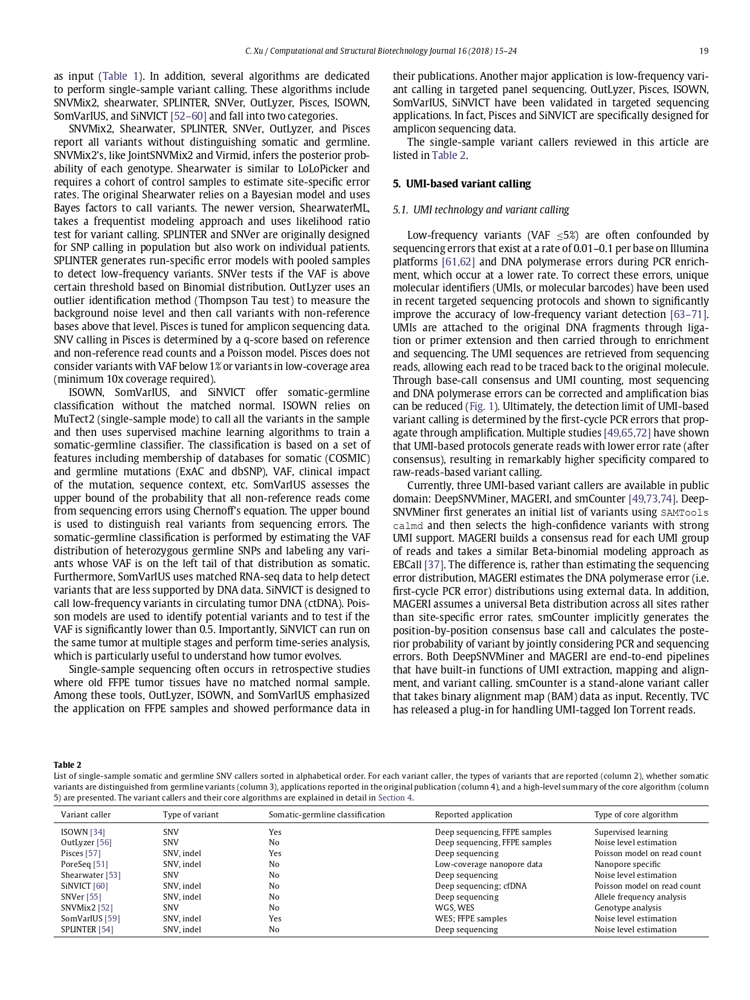


    Image #1:
    Origin: file:/workspace/visual-nlp-workshop/jupyter/data/images/pubmed/823__3.jpg
    Resolution: 150 dpi
    Width: 1257 px
    Height: 1632 px
    Mode: 5
    Number of channels: 3


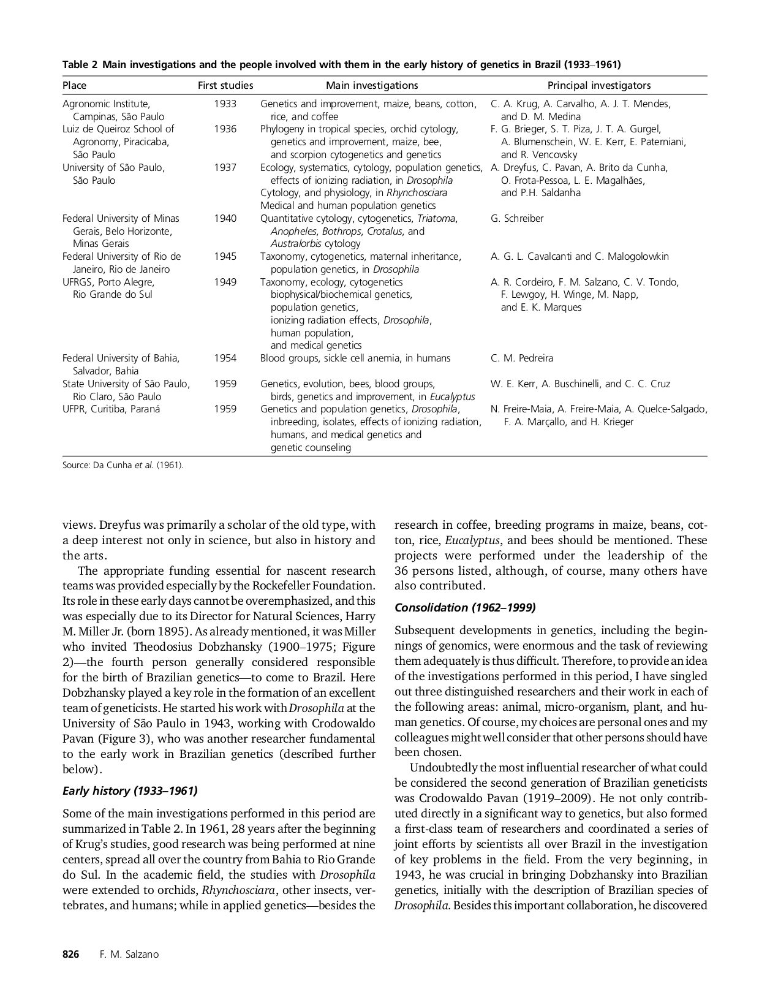

In [6]:
display_images(df)

In [7]:
proc = VisualDocumentProcessor() \
    .setInputCol("image") \
    .setOutputCols(["text", "tables"]) \
    .setFreeTextOnly(True) \
    .setOcrEngine(VisualDocumentProcessorOcrEngines.EASYOCR)

result = proc.transform(df).cache()
result.show()

22:01:35, INFO Run visual document processor                        (0 + 2) / 2]
22:01:36, INFO Run visual document processor
22:02:35, INFO detected formats: [<InputFormat.IMAGE: 'image'>]     (0 + 2) / 2]
22:02:35, INFO Going to convert document batch...
22:02:35, INFO Initializing pipeline for StandardPdfPipeline with options hash 6a634e914419463bfbf75b12c1ad829a
22:02:36, INFO Loading plugin 'docling_defaults'
22:02:36, INFO Registered ocr engines: ['easyocr', 'ocrmac', 'rapidocr', 'tesserocr', 'tesseract']
22:02:36, INFO Accelerator device: 'cuda:0'
22:02:38, INFO detected formats: [<InputFormat.IMAGE: 'image'>]
22:02:38, INFO Going to convert document batch...
22:02:38, INFO Initializing pipeline for StandardPdfPipeline with options hash 6a634e914419463bfbf75b12c1ad829a
22:02:38, INFO Accelerator device: 'cuda:0'
22:02:39, INFO Loading plugin 'docling_defaults'
22:02:39, INFO Registered ocr engines: ['easyocr', 'ocrmac', 'rapidocr', 'tesserocr', 'tesseract']
22:02:39, INFO Accele

+--------------------+--------------------+-------------------+-------+-------+--------------------+--------------------+---------+
|               image|                path|   modificationTime| length|pagenum|                text|              tables|exception|
+--------------------+--------------------+-------------------+-------+-------+--------------------+--------------------+---------+
|{file:/workspace/...|file:/workspace/v...|2025-08-26 21:53:30|1438004|      0|[45 to perform si...|[{NULL, [[{ISOWN ...|     NULL|
|{file:/workspace/...|file:/workspace/v...|2025-08-26 21:53:29|1043573|      0|[Table 2 Main inv...|[{NULL, [[{Agrono...|     NULL|
+--------------------+--------------------+-------------------+-------+-------+--------------------+--------------------+---------+



In [8]:
for _, v in result.select("text").toPandas().iterrows():
  for txt in v["text"]:
      print(txt)

45 to perform single-sample variant calling: These algorithms include SomVarIUS, and SiNVICT [52-60] and fall into two categories.

SNVMix2,  Shearwater, SPLINTER,   SNVer, OutLyzer; and Pisces report all variants without  distinguishing somatic and germline. SNVMix2's, like JointSNVMix2 and Virmid, infers the posterior ability of each genotype. Shearwater is similar to LoLoPicker and requires a colort of control samples to estimate site-specific error rates. The original Shearwater relies on a Bayesian model and uses takes 4 frequentist modeling approach and uses likelihood   ratio test for variant calling: SPLINTER and SNVer are originally designed for SNP calling in population but also work on individual patients. SPLINTER generates run-specific error models with pooled samples to detect low-frequency variants. SNVer tests if the VAF is above certain threshold based on Binomial distribution: OutLyzer uses an outlier identification method ( Thompson Tau test) to measure the backgroun

In [9]:
from pyspark.sql.functions import explode, col, monotonically_increasing_id
result = result.withColumn("table", explode(col("tables"))).withColumn("id", monotonically_increasing_id())
display_tables(result, table_col = "table", table_index_col = "id", empty_val = "")

Filename: main_1__4.jpg
Page: 0
Table: 0
Number of Columns: 5


col0,col1,col2,col3,col4
ISOWN [ 34] OutLyzer [56] Pisces [57] PoreScq [51] Shearwater [53] SiNVICT [60] SNVer [55] SNVMix2 [52] SomVarlUS [59] SPLINTER [54],"SNV SNV SNV , indel SNV , indel SNV SNV , indel SNV , indel SNV SNV , indel SNV , indel",Yes No Yes No No No No No Yes No,"sequencing FFPE samples Decp sequencing, FFPE samples Decp sequencing Low-coverage nanopore data Deep sequencing Decp sequencing; cfDNA Dccp scquencing WGS, WES WES; FFPE samples Dcep sequencing Dcep",Supervised learning Noise level estimtion Poisson model on read count Nanopore specific Noise level estimation Poisson model on read count Allele frequency Jnalysis Genotype analysis Noise level estimation Noise level estimation


Filename: 823__3.jpg
Page: 0
Table: 8589934592
Number of Columns: 4


col0,col1,col2,col3
Agronomic Institute; Campinas; São Paulo,1933,"Genetics and improvement; maize; beans, cotton, rice; and coffee","C A. Carvalho; A. J. T. Mendes , and D M Medina Krug,"
"Agronomy , Piracicaba; São Paulo",1936,"Phylogeny in tropical species, orchid cytology, genetics and improvement, maize; bee, and scorpion cytogenetics and genetics","F. G. Brieger, 5. T. Piza, J. T. A. Gurgel A. Blumenschein , W. E Kerr, E. Paterniani and R. Vencovsky"
"University of São Paulo , São Paulo",1937,"Ecology, systema cytology, population genetics; effects of ionizing radiation; in Drosophila Cytology; and physiology, in Rhynchosciara Medical and human population genetics tics,","4 Dreyfus; C Pavan A. Brito da Cunha, 0. Frota-Pessoa; L E. Magalhães , and PH. Saldanha"
"Federal University of Minas Gerais , Belo Horizonte Minas Gerais",1940,"Quantitative cytology , cytogenetics; Triatoma; Anopheles; Bothrops; Crotalus, and Australorbis cytology",G. Schreiber
Federal University of Rio de Janeiro; Rio de Janeiro,1945,"Taxonomy , cytogenetics; maternal inheritance population genetics; in Drosophila",A G. L Cavalcanti and C. Malogolowkin
"UFRGS , Porto Alegre; Rio Grande do Sul",1949,"Taxonomy , ecology, cytogenetics biophysicalbiochemical genetics; population genetics, ionizing radiation effects, Drosophila human population and medical genetics","A. R. Cordeiro, F M. Salzano F. Lewgoy, H. Winge, M. Napp, and E K. Marques"
"Federal University of Bahia; Salvador , Bahia",1954,Blood groups; sickle cell anemia; in humans,c. M. Pedreira
"State University of São Paulo, Rio Claro, São Paulo",1959,"Genetics , evolution; bees; blood groups; birds , genetics and improvement; in Eucalyptus","W. E. Kerr A. Buschinelli , and C. C. Cruz"
"UFPR, Curitiba, Paraná",1959,"Genetics and population genetics, Drosophila , inbreeding; isolates; effects of ionizing radiation , humans , and medical genetics and genetic counseling","N. Freire-Maia A. Freire-Maia, A. Quelce-Salgado, F.A Marçallo; and H. Krieger"


# PDF input file

In [10]:
from sparkocr.transformers import *
from sparkocr.enums import *
from sparkocr.utils import display_images, display_tables
from pyspark.ml import PipelineModel

pdfPath = "./data/pdfs/f1120.pdf"

df = spark.read.format("binaryFile").load(pdfPath)

proc = VisualDocumentProcessor() \
    .setInputCol("content") \
    .setOutputCols(["text", "tables"]) \
    .setFreeTextOnly(True) \
    .setOcrEngine(VisualDocumentProcessorOcrEngines.EASYOCR)
    
result = proc.transform(df).cache()
result.show()

22:03:00, INFO Run visual document processor
22:03:00, INFO detected formats: [<InputFormat.PDF: 'pdf'>]
22:03:00, INFO Going to convert document batch...
22:03:00, INFO Initializing pipeline for StandardPdfPipeline with options hash f08f155a1a1a29002d20cf2682c295c8
22:03:00, INFO Accelerator device: 'cuda:0'
22:03:02, INFO Accelerator device: 'cuda:0'                         (0 + 1) / 1]
22:03:03, INFO Accelerator device: 'cuda:0'
22:03:03, INFO Processing document tmp
22:03:12, INFO Finished converting document tmp in 12.04 sec.
22:03:13, WARNING Parameter `strict_text` has been deprecated and will be ignored.
22:03:13, WARNING Parameter `strict_text` has been deprecated and will be ignored.
22:03:13, WARNING Parameter `strict_text` has been deprecated and will be ignored.
22:03:13, WARNING Parameter `strict_text` has been deprecated and will be ignored.
22:03:13, WARNING Parameter `strict_text` has been deprecated and will be ignored.
22:03:13, WARNING Parameter `strict_text` has be

+--------------------+-------------------+-------+--------------------+--------------------+--------------------+---------+
|                path|   modificationTime| length|             content|                text|              tables|exception|
+--------------------+-------------------+-------+--------------------+--------------------+--------------------+---------+
|file:/workspace/v...|2025-08-26 21:25:41|3471478|[25 50 44 46 2D 3...|[## 1120\n\nOMB N...|[{NULL, [[{1 Divi...|         |
+--------------------+-------------------+-------+--------------------+--------------------+--------------------+---------+



25/08/26 22:03:18 WARN PDType1Font: Using fallback font LiberationSans for base font Times-Roman
25/08/26 22:03:18 WARN PDType1Font: Using fallback font LiberationSans for base font Times-Bold
25/08/26 22:03:18 WARN PDType1Font: Using fallback font LiberationSans for base font Times-Italic
25/08/26 22:03:18 WARN PDType1Font: Using fallback font LiberationSans for base font Times-BoldItalic
25/08/26 22:03:18 WARN PDType1Font: Using fallback font LiberationSans for base font Helvetica
25/08/26 22:03:18 WARN PDType1Font: Using fallback font LiberationSans for base font Helvetica-Bold
25/08/26 22:03:18 WARN PDType1Font: Using fallback font LiberationSans for base font Helvetica-Oblique
25/08/26 22:03:18 WARN PDType1Font: Using fallback font LiberationSans for base font Helvetica-BoldOblique
25/08/26 22:03:18 WARN PDType1Font: Using fallback font LiberationSans for base font Courier
25/08/26 22:03:18 WARN PDType1Font: Using fallback font LiberationSans for base font Courier-Bold
25/08/26 22


    Image #0:
    Origin: file:/workspace/visual-nlp-workshop/jupyter/data/pdfs/f1120.pdf
    Resolution: 300 dpi
    Width: 2549 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


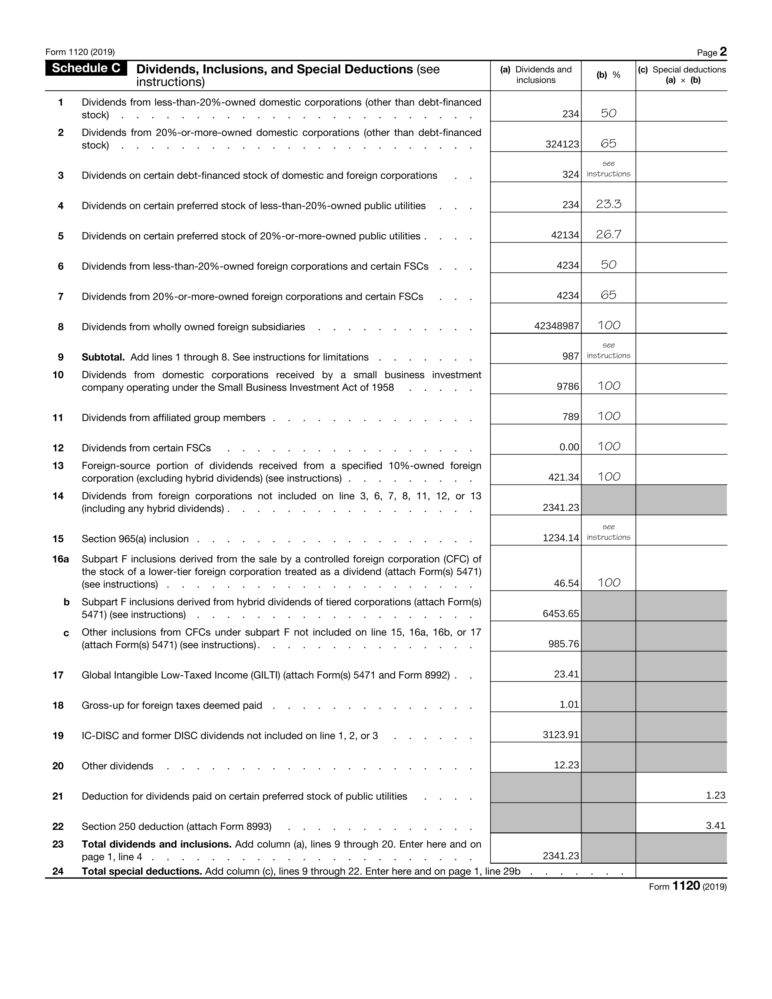


    Image #1:
    Origin: file:/workspace/visual-nlp-workshop/jupyter/data/pdfs/f1120.pdf
    Resolution: 300 dpi
    Width: 2549 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


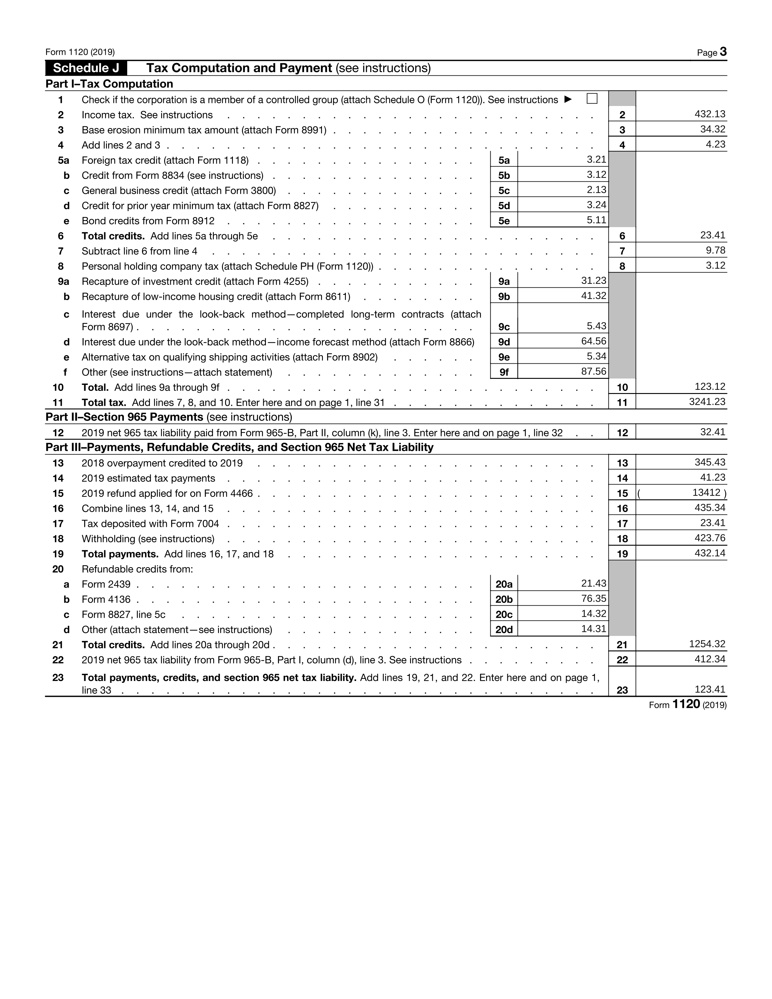


    Image #2:
    Origin: file:/workspace/visual-nlp-workshop/jupyter/data/pdfs/f1120.pdf
    Resolution: 300 dpi
    Width: 2549 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


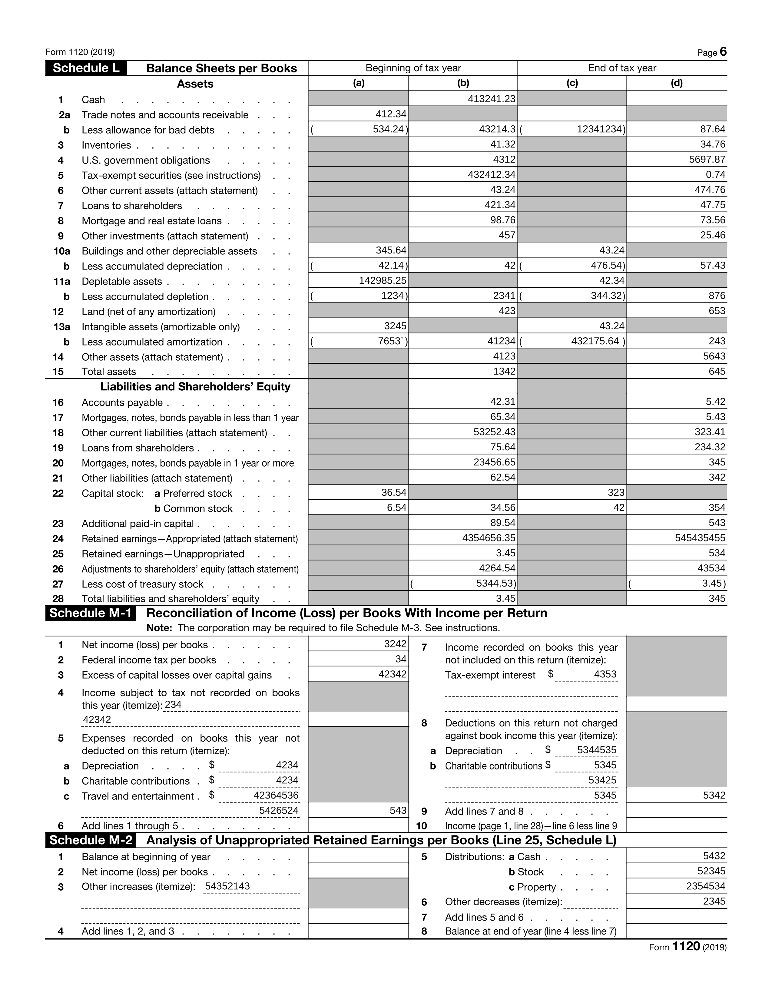


    Image #3:
    Origin: file:/workspace/visual-nlp-workshop/jupyter/data/pdfs/f1120.pdf
    Resolution: 300 dpi
    Width: 2549 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


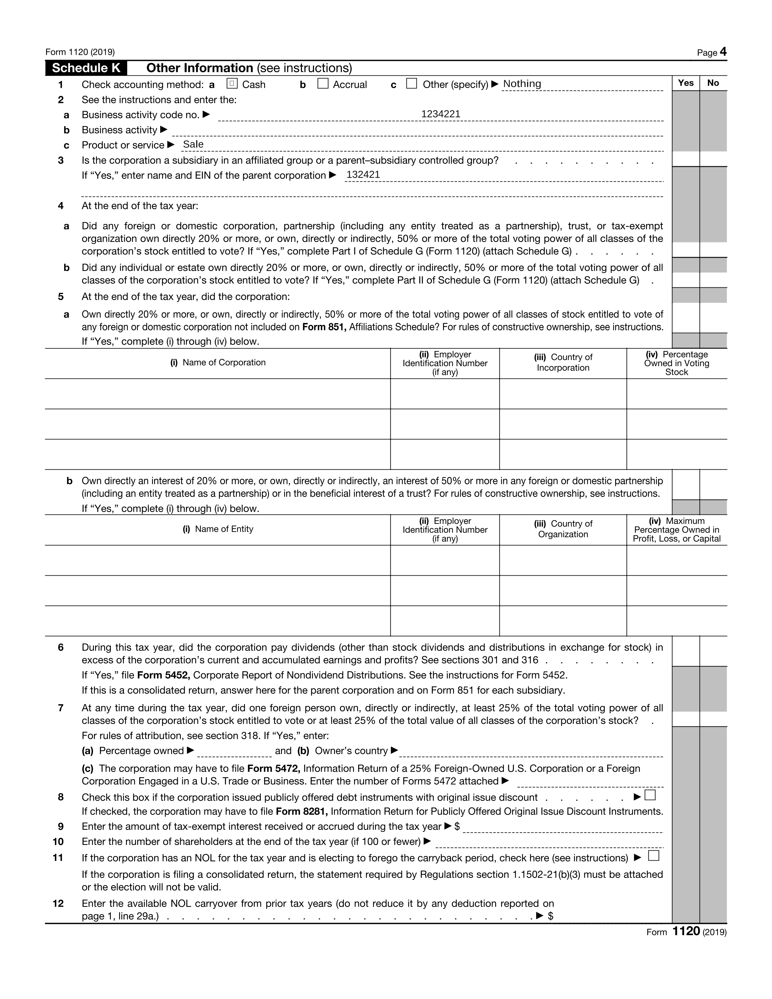


    Image #4:
    Origin: file:/workspace/visual-nlp-workshop/jupyter/data/pdfs/f1120.pdf
    Resolution: 300 dpi
    Width: 2549 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


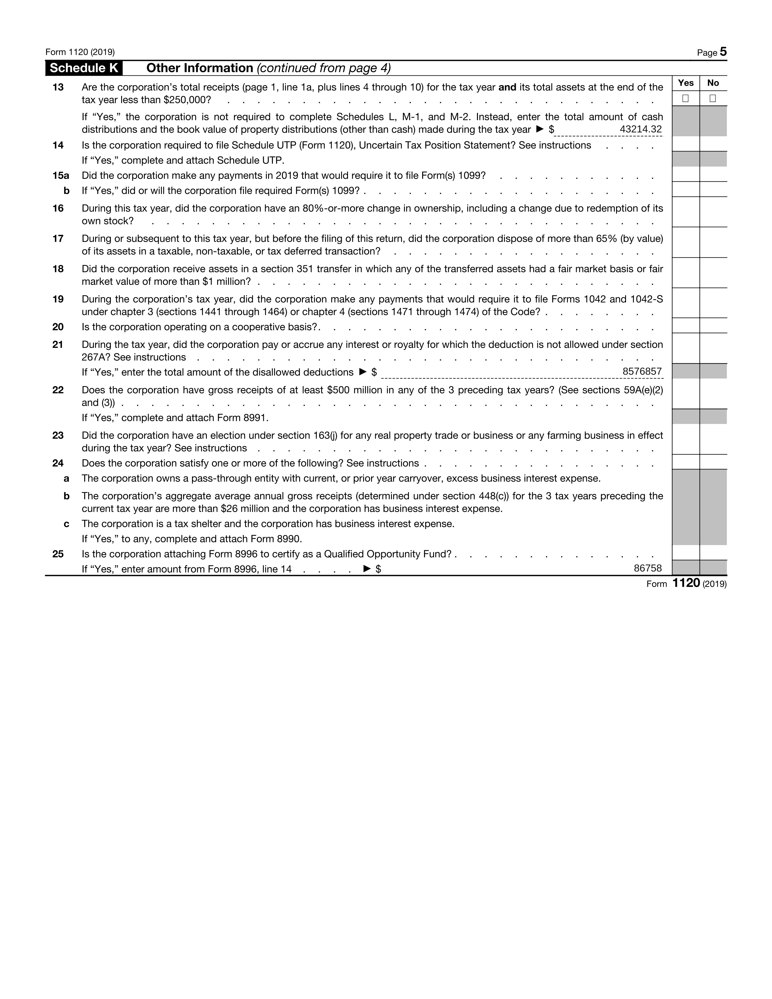

In [11]:
from sparkocr.utils import display_pdf

display_pdf(df)

In [12]:
for _, v in result.select("text").toPandas().iterrows():
  for txt in v["text"]:
      print(txt)
      print("======== End of page ===============")

## 1120

OMB No. 1545-0123

Form

## U.S. Corporation Income Tax Return

For calendar year 2019 or tax year beginning , 2019, ending

Department of the Treasury Internal Revenue Service

▶ Go to www.irs.gov/Form1120 for instructions and the latest information.

TYPE OR PRINT

Name

Number, street, and room or suite no. If a P.O. box, see instructions.

City or town, state or province, country, and ZIP or foreign postal code

- A   Check if:

- 1a Consolidated return (attach Form 851)

.

- b Life/nonlife consoli- dated return . .

.

- 2 Personal holding co. (attach Sch. PH) .

.

- 3 Personal service corp. (see instructions) .

.

- 4 Schedule M-3 attached

- B  Employer identification number

- C Date incorporated

- D Total assets (see instructions)

$

E

Check if:

(1)

Initial return

(2)

Final return

(3)

Name change

(4)

Address change

Income

- 1a Gross receipts or sales

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

1a

- b Returns and allowances .

.

.

.

.

.


# Output format JSON

In [13]:
import json

imagePath = "./data/images/pubmed/*.jpg"

df = spark.read.format("binaryFile").load(imagePath)

bin_to_image = BinaryToImage() \
    .setInputCol("content") \
    .setOutputCol("image") \
    .setImageType(ImageType.TYPE_3BYTE_BGR)

df = bin_to_image.transform(df).cache().limit(2)

proc = VisualDocumentProcessor() \
    .setInputCol("image") \
    .setOutputCols(["text", "tables"]) \
    .setOutputFormat(OcrOutputFormat.JSON) \
    .setOcrEngine(VisualDocumentProcessorOcrEngines.EASYOCR)

result = proc.transform(df).cache()

for _, v in result.select("text").toPandas().iterrows():
  for txt in v["text"]:
      parsed = json.loads(txt)
      print(json.dumps(parsed, indent=4))

22:03:21, INFO Run visual document processor
22:03:21, INFO detected formats: [<InputFormat.IMAGE: 'image'>]
22:03:21, INFO Going to convert document batch...
22:03:21, INFO Initializing pipeline for StandardPdfPipeline with options hash 6a634e914419463bfbf75b12c1ad829a
22:03:21, INFO Accelerator device: 'cuda:0'
22:03:21, INFO Run visual document processor
22:03:21, INFO detected formats: [<InputFormat.IMAGE: 'image'>]
22:03:21, INFO Going to convert document batch...
22:03:21, INFO Initializing pipeline for StandardPdfPipeline with options hash 6a634e914419463bfbf75b12c1ad829a
22:03:21, INFO Accelerator device: 'cuda:0'
22:03:23, INFO Accelerator device: 'cuda:0'                         (0 + 2) / 2]
22:03:23, INFO Accelerator device: 'cuda:0'
22:03:23, INFO Accelerator device: 'cuda:0'
22:03:23, INFO Accelerator device: 'cuda:0'
22:03:24, INFO Processing document tmp
22:03:24, INFO Processing document tmp
22:03:30, INFO Finished converting document tmp in 9.67 sec.


{
    "schema_name": "DoclingDocument",
    "version": "1.5.0",
    "name": "tmp",
    "origin": {
        "mimetype": "application/pdf",
        "binary_hash": 13445220864746338093,
        "filename": "tmp"
    },
    "furniture": {
        "self_ref": "#/furniture",
        "children": [],
        "content_layer": "furniture",
        "name": "_root_",
        "label": "unspecified"
    },
    "body": {
        "self_ref": "#/body",
        "children": [
            {
                "$ref": "#/texts/0"
            },
            {
                "$ref": "#/texts/1"
            },
            {
                "$ref": "#/texts/2"
            },
            {
                "$ref": "#/texts/3"
            },
            {
                "$ref": "#/texts/4"
            },
            {
                "$ref": "#/texts/5"
            },
            {
                "$ref": "#/texts/6"
            },
            {
                "$ref": "#/texts/7"
            },
            {
    

22:03:33, INFO Finished converting document tmp in 11.97 sec.


# PPTX case

In [14]:
pptxPath = "./data/ppt/*.pptx"

df = spark.read.format("binaryFile").load(pptxPath)

proc = VisualDocumentProcessor() \
    .setInputCol("content") \
    .setOutputCols(["text", "tables"]) \
    .setOcrEngine(VisualDocumentProcessorOcrEngines.EASYOCR)

result = proc.transform(df).cache()

for _, v in result.select("text").toPandas().iterrows():
  for txt in v["text"]:
      print(txt)

22:03:33, INFO Run visual document processor
22:03:33, INFO detected formats: [<InputFormat.PPTX: 'pptx'>]
22:03:33, INFO Going to convert document batch...
22:03:33, INFO Initializing pipeline for SimplePipeline with options hash c15dcc3e06049db7f8a2a9b865065096
22:03:33, INFO Processing document tmp
22:03:34, WARNING Warning: image cannot be loaded by Pillow: cannot find loader for this WMF file
22:03:34, WARNING Warning: image cannot be loaded by Pillow: cannot find loader for this WMF file
22:03:34, WARNING Warning: image cannot be loaded by Pillow: cannot find loader for this WMF file
22:03:34, WARNING Warning: image cannot be loaded by Pillow: cannot find loader for this WMF file
22:03:34, INFO Finished converting document tmp in 0.29 sec.


# A Maintenance Program for a bus fleet

Lessons from a Potential CDM Project in India

Kaushik Deb, TERI
26 August 2004

Transport CDM Workshop

# Structure of the presentation

The policy context

CDM and transport: Synergies 

Key barriers

The Project

- Need for an effective maintenance
- Inspection Systems: CDM project
- Emission savings
- Cost estimates

Lessons
# Urban transport in India

Large urban population

- Over 1/3 in 2001
- 33% concentrated in cities with 10% population
- 82% are personal vehicles
- Effective public transport in only 10 cities
- Rail in only 3 cities
- Cities are vertices of continued growth

High vehicle density in urban areas

Inadequate public transport

No urban transport  policy

Diffused institutional arrangements

Implications for economic sustainability
26 August 2004

Transport CDM Workshop

# Trends in vehicle population
26 August 2004

Transport CDM Workshop

# Vehicle Ownership

Per capita 

income (US $) 

Cities

Vehicles Per 

1000 Perso